# end-to-end milti-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow Hub.

## 1. Problem

Identifiying the breed of a dog given an image of a dog.

Let's say I go for a walk and take a picture of a random dog, I want to know that what breed of dog it is.

## 2. Data

This data is from kaggle's dog breed identification competition.

link: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probablilities of each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some info about data:

* Deals with images (unstructured data), so it is best we use Deep learning or Transfer Learning.

* There are 120 different classes (breeds)

* 10000+ images in the training set. (with labels)

* 10000+ images in the test set. (no labels)

Get workspace ready

* Import TensorFlow
* Import TensorFlow

In [1]:
# import TensorFlow to colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version: ', tf.__version__)
print('TF Hub version: ', hub.__version__)

#check for GPU availability
print('GPU', 'available (Yess!!)' if tf.config.list_physical_devices('GPU') else 'not available')

TF version:  2.15.0
TF Hub version:  0.16.1
GPU not available


## Getting our data ready (turning into tensors)

With all ML models, our data has to be in numerical format. So that's what we'll be doing first.
Turning the images into tensors (numerical representation).

We can start by accessing our data and cheking out labels.

In [2]:
# Chekcout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/DogBreedIdentifier/data/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


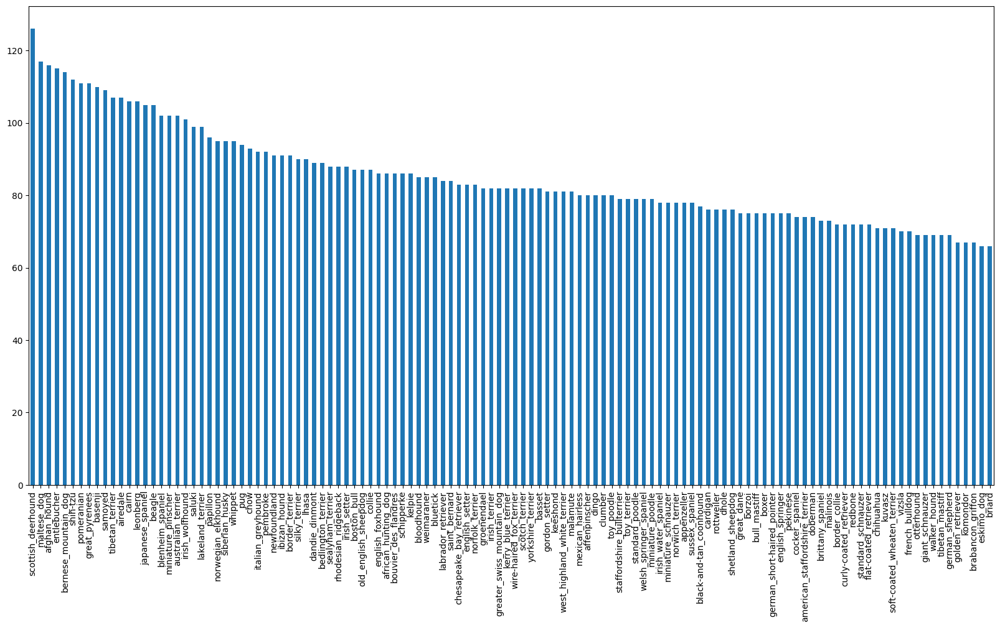

In [ ]:
# How many images are there in each breed?
labels_csv['breed'].value_counts().plot.bar(figsize= (20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

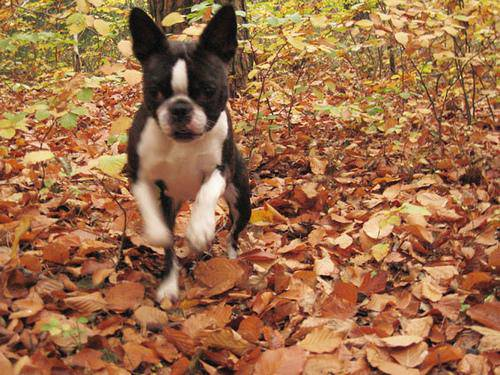

In [ ]:
# let's view an image
from IPython.display import Image
Image('drive/MyDrive/DogBreedIdentifier/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

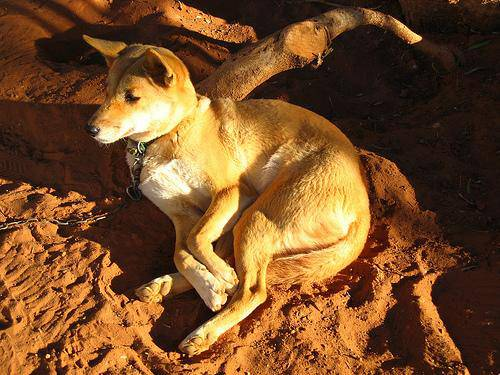

In [ ]:
# let's view an image
from IPython.display import Image
Image('drive/MyDrive/DogBreedIdentifier/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

## Getting images and their labels

to get a list of all images file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
# create pathnames from image ID's
filenames = ['drive/MyDrive/DogBreedIdentifier/data/train' + '/' + fname for fname in labels_csv['id'] + '.jpg']

#check the first 10
filenames[:10]

['drive/MyDrive/DogBreedIdentifier/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [4]:
# check whether number of file names matches number of actual image files.
import os
if len(os.listdir('/content/drive/MyDrive/DogBreedIdentifier/data/train/')) == len(filenames):
  print('filenames match actual amount of files')
else:
  print('filenames does not match actual amounts of files')

filenames match actual amount of files


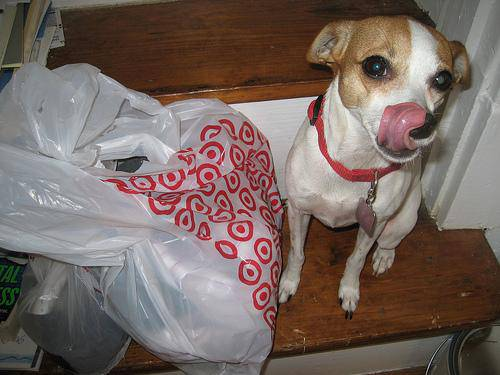

In [ ]:
# another check
Image(filenames[3435])

In [ ]:
labels_csv['breed'][3435]

'toy_terrier'

In [5]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels)   does the same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# to check if labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames')
else:
  print('number of labels does not match the number of filenames')

Number of labels matches number of filenames


In [6]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# example : turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax())  # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set since kaggle did not provide us with the validation set.

In [ ]:
# setum X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We can start experimenting with ~1000 images and increase as needed.

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min:1000, max:10000, step: 100 }
NUM_IMAGES

1000

In [ ]:
#we can use scikit learn train test split for splitting for valid
from sklearn.model_selection import train_test_split

#split into train and valid of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                    test_size = 0.2,
                                                    random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['drive/MyDrive/DogBreedIdentifier/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogBreedIdentifier/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogBreedIdentifier/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogBreedIdentifier/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogBreedIdentifier/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, 

## Preprocessing Images (turning images into tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input

2. Use TensorFlow to read the file and save it to a variable, `image`

3. Turn the `image` ( a `.jpg`) into Tensors

4. Resize the `image` to be a shape of (224, 224)

5. Return modified `image`



In [ ]:
# convert image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image into a Tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a tensor, let's make a function to preprocess them.

1. Take an image filepath as input

2. Use TensorFlow to read the file and save it to a variable, `image`

3. Turn the `image` ( a `.jpg`) into Tensors

4. Normalize image (convert color channel from 0-255 to 0-1).

5. Resize the `image` to be a shape of (224, 224)

6. Return modified `image`

In [25]:
# Define image size
IMG_SIZE = 224

# create a function for preprocessing images

def process_image(image_path):
  """
  Takes an image filepath and turns it into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image to numerical Tensors with 3 color channels ( Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size= [IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

Why turn into batches?

Let's say we try to process 10000+ images in one go... they might not fit into memory.

So, we do about 32 (ideal batch size acc to yann_lecun) images at a time.

In orer to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like (images, labels).

In [26]:
## Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """

  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
tf.constant(y[42]), y[42]

(<tf.Tensor: shape=(120,), dtype=bool, numpy=
 array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])>,

Now we got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a funtion to turn all our data (`X`, `y`) into batches!

In [23]:
# define a batch size, 32 is an ideal size
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it is training data and doesn't shuffle valid data.
  Also accepts test data as input (no labels).
  """
  # if data is a test dataset, we probably don't have labels.
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset, we don't need to shuffle
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepath
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if data is not test nor valid, it should be a training batch
  else:
    print('creating training data batches...')
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath
                                               tf.constant(y))) #labels
    # shuffling pathnames and labels to avoid overfitting our data to some specific pattern, example, some data can be sorted asc or dsc, which might make the model learn the patterns in that order.
    # also, shuffling the pathnames and labels before mapping image processor fnc is faster than shuffling images.
    data = data.shuffle(buffer_size=len(X))

    # create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch






In [ ]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
Creating validation data batches...


In [ ]:
# check the diff attri of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/ comprehend, so let's visualize them.




In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(image, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplots (5 rows, 5 cols)
    ax = plt.subplot(5, 5, i+1)
    # display an image
    plt.imshow(image[i])
    # add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # to turn the gridlines off
    plt.axis('off')

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

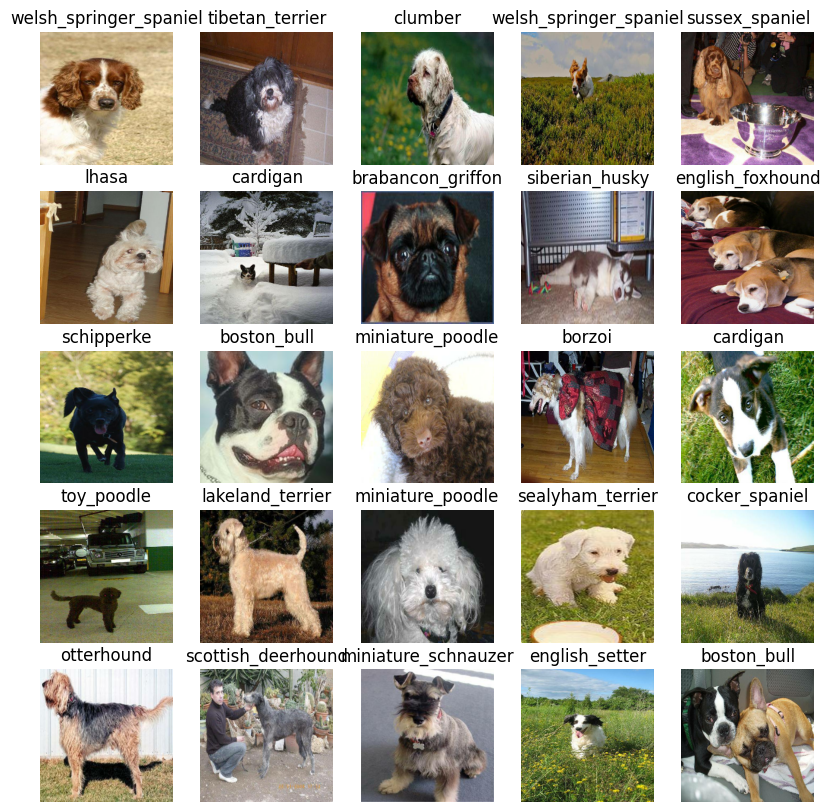

In [ ]:
# lets visualize the data in a training batch
show_25_images(train_images, train_labels)

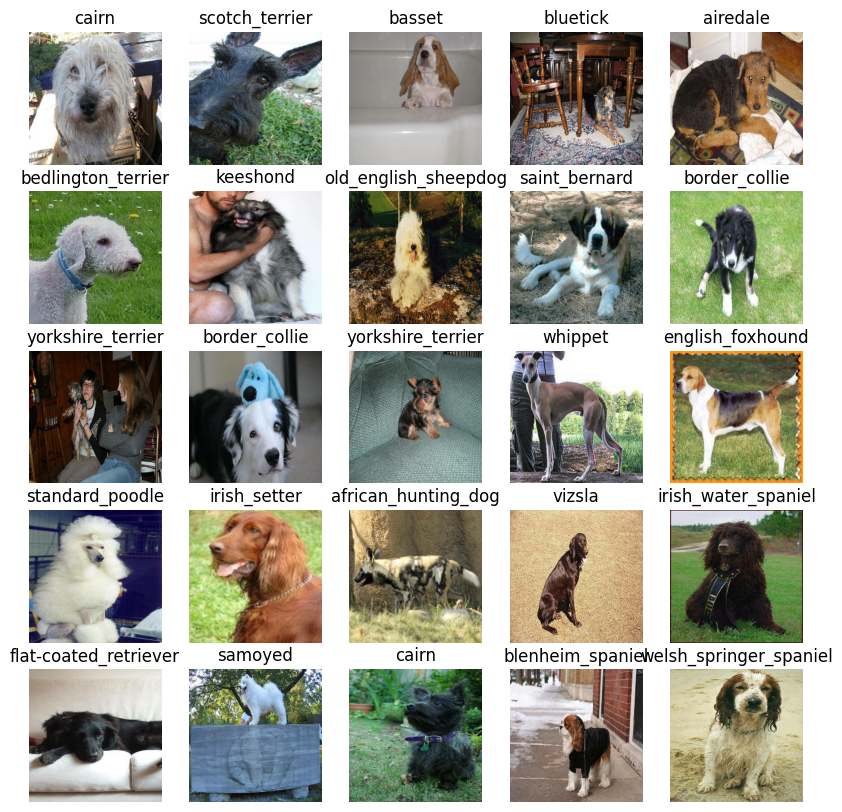

In [ ]:
# now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of tensors) of our model.
* The URL of the model we want to use. https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-128-classification/versions/2"

In [ ]:
IMG_SIZE

224

In [ ]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true"

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion ( do this first, then this, then that etc.).
* Compiles the model (says it should be evaluated and imroved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create 2 callbacks, one for t=TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

# TensorBoard Callback

To setup a tensorboard callback, we need to do 3 things:
1. Load the TensorBoard callback
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this right after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

# create a function to build TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/DogBreedIdentifier/logs',
                        #make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain eval metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step: 10}

In [ ]:
# Check to make sure we are still running on a GPU
print('GPU', 'available' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the train data, valid data, no of epochs to train for (`NUM_EPHOCS)` and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # return model
  return model


### Checking TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Epoch 1/100
25/25 [==============================] - 268s 11s/step - loss: 4.5844 - accuracy: 0.1037 - val_loss: 3.4492 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 163ms/step - loss: 1.6450 - accuracy: 0.6712 - val_loss: 2.1993 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 5s 188ms/step - loss: 0.5624 - accuracy: 0.9375 - val_loss: 1.7299 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 4s 163ms/step - loss: 0.2502 - accuracy: 0.9912 - val_loss: 1.5690 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1440 - accuracy: 0.9987 - val_loss: 1.4825 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0983 - accuracy: 0.9987 - val_loss: 1.4378 - val_

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DogBreedIdentifier/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 3s 165ms/step


array([[1.1928184e-03, 2.4454045e-04, 1.3630197e-04, ..., 3.0288662e-04,
        8.7608845e-05, 1.0175542e-03],
       [1.2548214e-03, 1.8262498e-03, 7.4719284e-03, ..., 2.6139570e-04,
        8.1940405e-03, 1.0411588e-04],
       [5.0196522e-06, 7.8869925e-05, 2.7321378e-06, ..., 1.7640368e-05,
        1.0811731e-05, 6.4928507e-05],
       ...,
       [2.3585164e-06, 2.8005872e-05, 6.8752070e-06, ..., 1.0410133e-05,
        4.1508938e-05, 1.7042799e-04],
       [2.8158098e-03, 3.1831293e-04, 7.7888420e-05, ..., 1.6633539e-04,
        3.0048209e-04, 2.5916576e-02],
       [1.4593300e-03, 2.9049170e-05, 4.6154638e-04, ..., 5.4923486e-04,
        3.0752653e-04, 1.6357108e-05]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# first prediction
index = 42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")



[1.19281840e-03 2.44540453e-04 1.36301969e-04 5.98305924e-05
 6.36879413e-04 2.83587069e-05 8.64212885e-02 1.82740064e-03
 2.19705980e-04 1.84665070e-04 7.71427818e-04 3.02268672e-05
 2.45965290e-04 2.73293903e-04 6.22363819e-04 1.75474634e-04
 4.13643902e-05 2.05730692e-01 8.75416954e-05 5.79935586e-05
 1.04664639e-03 5.33547136e-04 1.08820141e-05 1.44303229e-03
 5.01629729e-05 2.29520723e-04 2.53761619e-01 2.17732057e-04
 3.36705707e-04 4.73459659e-05 1.58718860e-04 2.15468206e-03
 1.25934719e-03 3.74107585e-05 1.60738506e-04 2.77877357e-02
 1.86061134e-05 4.70612838e-04 7.23859703e-05 3.64384556e-04
 2.14713253e-03 4.85666023e-05 3.54021875e-04 7.02452322e-04
 2.90393564e-05 3.41053877e-04 2.90538737e-04 6.63183891e-05
 5.91808523e-04 8.17879336e-05 2.71739700e-04 4.32382367e-05
 8.64285335e-04 4.87488760e-05 1.53244109e-05 2.21860071e-04
 1.74650544e-04 2.31310748e-03 1.08179498e-04 6.60445839e-02
 6.21653162e-04 1.49111394e-04 5.35221712e-04 2.29281613e-05
 9.39747551e-04 5.472933

Having the above funtionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [59]:
# turn probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[47])
pred_label


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [ ]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

# loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we got ways to get:
* Prediction labels
* Validation labels
* Validation images

Let's make a function to make this all visual.

We'll create a function which:

* Takes an array of pred probs, an array of truth labels and an array of images and an integer.
* Convert the prediction probs to a predicted label.
* Plot the pred label, its pred prob, truth label nad the target image on a single point

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'


  # change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label), color = color)

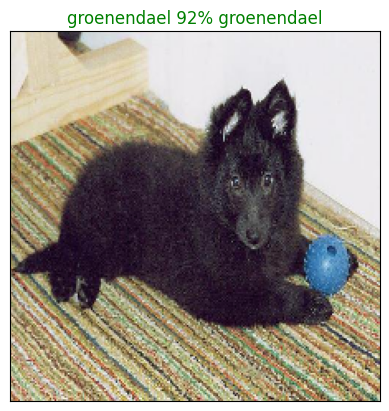

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n = 77)

Now we've got one function to visualize our models top prediction, let's make another to view models top 10 preds

This func will:
* Take an input of pred prob array and a ground truth array and an integer
* Find the pred using `get_pred_label()`
* Find the top 10:
  * pred prob indexes
  * pred prob values
  * pred labels
* plot the top 10 prediction prob values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the top 10 pred confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find top 10 pred labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels,)),
             labels = top_10_pred_labels,
             rotation = 'vertical')

  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass


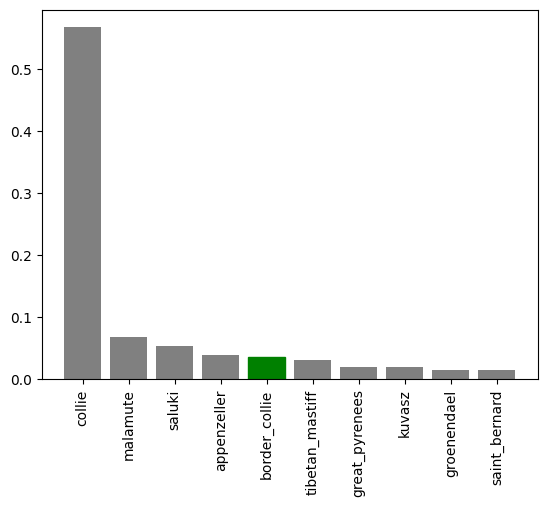

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

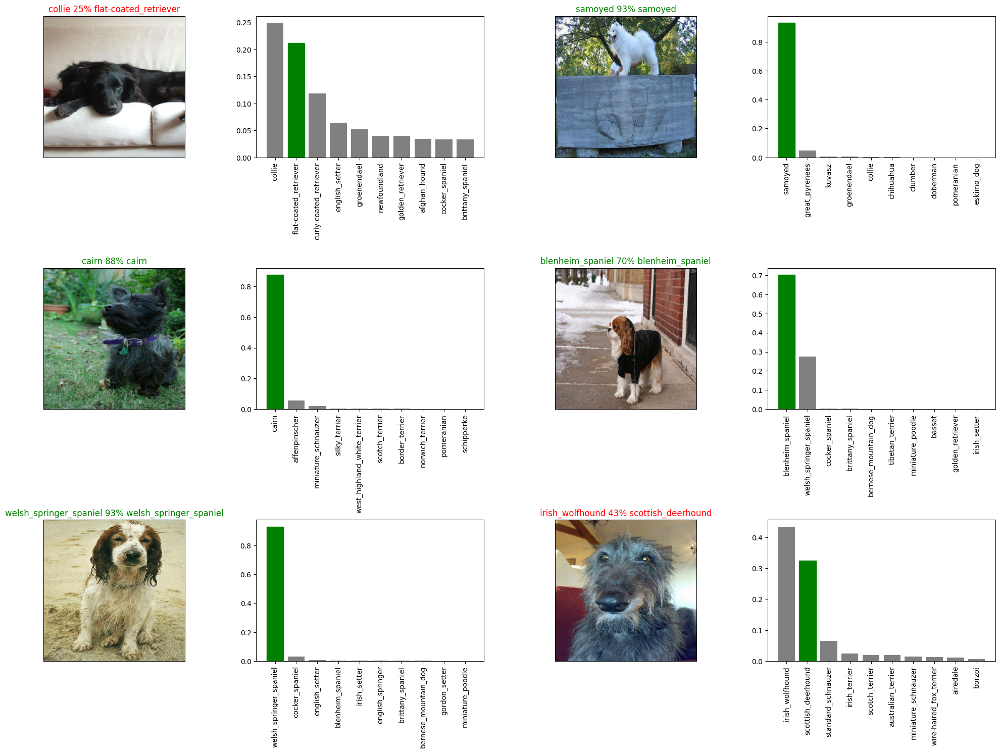

In [ ]:
# Let's Check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()


# Saving and leading a model

In [31]:
# create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """

  # create model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/DogBreedIdentifier/Models', datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [30]:
# create a function to lead a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer': hub.KerasLayer})

  return model

Now we've got funtions to load and save the model, let's make sure they work!

In [ ]:
# save our model trained on 1000 images
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/DogBreedIdentifier/Models/20240329-12411711716112-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/DogBreedIdentifier/Models/20240329-12411711716112-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# load a trained model
loaded_1000_image_trained_model = load_model('/content/drive/MyDrive/DogBreedIdentifier/Models/20240329-12411711716112-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/DogBreedIdentifier/Models/20240329-12411711716112-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 233ms/step - loss: 1.3314 - accuracy: 0.6400


[1.3313686847686768, 0.6399999856948853]

In [ ]:
# evaluate the loaded model
loaded_1000_image_trained_model.evaluate(val_data)

7/7 [==============================] - 3s 145ms/step - loss: 1.3314 - accuracy: 0.6400


[1.3313686847686768, 0.6399999856948853]

## Training a big dog model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/DogBreedIdentifier/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogBreedIdentifier/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# create a data catch with the full data set
full_data = create_data_batches(X, y)

creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

**NOTE:** Running a cell below will take a little while (maybe upto 30 mins for the first epoch) since the GPU will have top load all the images into memory.

In [ ]:
# fit the full model to full data
full_model.fit(x = full_data, epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 48s 136ms/step - loss: 1.3149 - accuracy: 0.6780
Epoch 2/100
320/320 [==============================] - 43s 134ms/step - loss: 0.3972 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 41s 129ms/step - loss: 0.2336 - accuracy: 0.9390
Epoch 4/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1509 - accuracy: 0.9648
Epoch 5/100
320/320 [==============================] - 40s 123ms/step - loss: 0.1047 - accuracy: 0.9803
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0775 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0589 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0465 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0374 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 43s 134m

In [ ]:
save_model(full_model, suffix = 'full-image-set-mobilenetv2')

Saving model to: /content/drive/MyDrive/DogBreedIdentifier/Models/20240329-13541711720459-full-image-set-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/DogBreedIdentifier/Models/20240329-13541711720459-full-image-set-mobilenetv2.h5'

In [36]:
# loading full model
loaded_full_model = load_model('/content/drive/MyDrive/DogBreedIdentifier/Models/20240329-13541711720459-full-image-set-mobilenetv2.h5')

Loading saved model from: /content/drive/MyDrive/DogBreedIdentifier/Models/20240329-13541711720459-full-image-set-mobilenetv2.h5


## making predictions on the test dataset

since the model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get in into the same format.

we've created `create_data_batches()` earlier which can take a list of filenames as input and conver then into Tensor batches.

To make predictions on the test data, we'll:
* get the test image filenames
* convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`(since the test data doesn't have labels).
* make a predictions array by passing the test data batches to the `predict()`method called on our model

In [13]:
# load test image filenames
test_path = '/content/drive/MyDrive/DogBreedIdentifier/data/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/DogBreedIdentifier/data/test/f4e1d93f8d4f389547d69a5cd468e49d.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f5a6e430c2c363335d22ae0593d7533a.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f4db24d71e6f3100614eb4543f98394f.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f16ce30657f7dec9cf08597bbce2ffdb.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/e8f51d54d179b05ea4cc9c726cae9229.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f05275e168cf813f7dadd9d1dddfab8a.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f0ee3d22666302ec27338aa29f34c72f.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/f574f558d78db4e616e91f5dd5347409.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/ef1710d5cb79a5e0b46f7b9a101a25b4.jpg',
 '/content/drive/MyDrive/DogBreedIdentifier/data/test/e8c778896a73d0f6b4f88c564690c9db.jpg']

In [ ]:
len(test_filenames)

10357

In [44]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [45]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run

In [46]:
# make predictions on test data batch using the loaded model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

  3/324 [..............................] - ETA: 31:40

KeyboardInterrupt: 

In [ ]:
np.savetxt('/content/drive/MyDrive/DogBreedIdentifier/preds_array.csv', test_predictions, delimiter = ',')

In [7]:
test_predictions = np.loadtxt('/content/drive/MyDrive/DogBreedIdentifier/preds_array.csv', delimiter = ',')

In [8]:
test_predictions[:10]

array([[2.53151215e-11, 9.99943614e-01, 4.66810377e-08, ...,
        5.30003703e-08, 6.69911609e-13, 3.60668925e-11],
       [2.80988479e-05, 5.40705478e-05, 6.99649366e-11, ...,
        2.30142030e-10, 8.45607473e-11, 6.58458010e-11],
       [2.45771647e-09, 2.02036637e-10, 2.12610871e-07, ...,
        4.62749767e-06, 6.79407697e-10, 5.57886004e-09],
       ...,
       [2.53087218e-10, 9.86593604e-01, 6.00500627e-09, ...,
        1.99238730e-05, 4.25582414e-09, 3.96290361e-08],
       [1.49764685e-06, 1.04070430e-04, 9.57032000e-08, ...,
        1.99646524e-06, 9.03777764e-09, 1.03454973e-07],
       [1.67214349e-01, 7.20693788e-06, 2.17048548e-08, ...,
        2.78393685e-07, 3.64478296e-06, 3.99404031e-04]])

In [9]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample Submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepathds
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [10]:
['id']+ list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [11]:
# create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns = ['id']+ list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [14]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [15]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f4e1d93f8d4f389547d69a5cd468e49d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f5a6e430c2c363335d22ae0593d7533a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f4db24d71e6f3100614eb4543f98394f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f16ce30657f7dec9cf08597bbce2ffdb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e8f51d54d179b05ea4cc9c726cae9229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,08152b214c5b628d9e70f609230fd51c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,0854e34e53c9dd84579d4c37086dbdf5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,07a61998ec9044e9c977274476e07681,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,0829420985a1d5b647b969d44af3e844,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# ADD THE PRED PROBS TO EACH DOG BREED COLUMN
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f4e1d93f8d4f389547d69a5cd468e49d,2.531512e-11,9.999436e-01,4.668104e-08,2.387430e-11,1.559809e-12,1.405214e-12,1.440194e-10,8.131229e-14,6.375258e-13,...,2.526698e-11,7.470835e-14,1.858796e-12,3.656653e-10,9.395094e-11,2.650120e-14,5.188128e-11,5.300037e-08,6.699116e-13,3.606689e-11
1,f5a6e430c2c363335d22ae0593d7533a,2.809885e-05,5.407055e-05,6.996494e-11,8.388774e-07,9.022587e-11,1.183599e-10,8.435081e-12,6.932923e-09,1.407396e-10,...,2.150016e-08,5.533053e-12,2.318220e-09,4.877007e-10,5.673194e-09,2.974016e-12,3.391813e-10,2.301420e-10,8.456075e-11,6.584580e-11
2,f4db24d71e6f3100614eb4543f98394f,2.457716e-09,2.020366e-10,2.126109e-07,8.536205e-07,2.074184e-06,2.919519e-05,4.250376e-10,2.962548e-09,9.307704e-09,...,4.872773e-10,1.584989e-08,2.935589e-05,5.048531e-06,3.789601e-02,3.476391e-08,1.721943e-07,4.627498e-06,6.794077e-10,5.578860e-09
3,f16ce30657f7dec9cf08597bbce2ffdb,3.163622e-12,5.429628e-09,6.700892e-11,6.933436e-11,4.163389e-13,9.233229e-11,6.954286e-10,3.003754e-11,8.911466e-09,...,9.777787e-11,3.142555e-08,1.449554e-07,2.596382e-10,1.789282e-09,1.055549e-13,8.637288e-13,2.179801e-11,1.590910e-10,2.245409e-10
4,e8f51d54d179b05ea4cc9c726cae9229,3.444818e-07,4.707572e-08,5.393537e-06,5.004459e-08,5.025203e-09,1.112069e-09,9.344538e-07,7.738785e-11,1.537630e-10,...,3.081286e-10,6.092067e-10,1.890136e-08,3.056545e-07,4.969048e-08,1.745149e-12,3.256722e-10,8.412508e-06,3.264218e-08,2.140319e-11


In [17]:
# save preds df to csv for submission to kaggle
preds_df.to_csv('/content/drive/MyDrive/DogBreedIdentifier/full_model_preds_submission_mobilenetv2.csv',
                index = False)

## Making predictions on custom images

To make preds on custom images:
* Get the filepaths.
* Turn the filepaths into data batches using `create_data_batches()`. And since the custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass custom images data batch to our model's `predict()` method.
* convert prediction output probs to prediction labels.
* compare the predicted labels to custom images.

In [39]:
# get custom image filepaths
custom_path = 'drive/MyDrive/DogBreedIdentifier/dogphotos/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [51]:
custom_image_paths = custom_image_paths[1:]

In [53]:
# turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [54]:
# make preds with model on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 311ms/step


In [56]:
custom_preds.shape

(3, 120)

In [60]:
# get custom image preds labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'labrador_retriever', 'pomeranian']

In [62]:
# get custom images ( unbachify() funtion won't work since there aren't labels... maybe can fix it later)
custom_images = []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

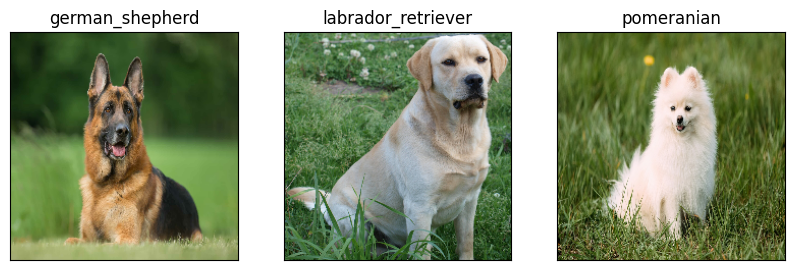

In [64]:
import matplotlib.pyplot as plt
# check custom image preds
plt.figure(figsize = (10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)